# Cicada songs: finding periodicity

This will be a blog post.

## Resources

- [Pydub](http://pydub.com/)
- [https://www.scottcondron.com/jupyter/visualisation/audio/2020/10/21/interactive-audio-plots-in-jupyter-notebook.html](https://www.scottcondron.com/jupyter/visualisation/audio/2020/10/21/interactive-audio-plots-in-jupyter-notebook.html)
- https://www.youtube.com/watch?v=DSJoFMwSXro
- https://www.youtube.com/watch?v=aercHtlayj0

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from pydub import AudioSegment
from pydub.playback import play

from scipy.signal.windows import hamming
from scipy.signal import spectrogram, find_peaks, detrend

In [2]:
# works with Jupyter but not VScode (yet, request accepted as of 07.2022)
# https://github.com/microsoft/vscode/issues/151149
from IPython import display
audio_path = "../data/2022-08-06_1611.mp3"
display.Audio(filename=audio_path)

In [3]:
recording = AudioSegment.from_mp3("../data/2022-08-06_1611.mp3")
recording_mono = recording.set_channels(1) # convert to mono
sampling_rate = recording.frame_rate # in Hz

start = 31 # in s
end = 931 # in s
delta = end-start

sample_mono = recording_mono[start*1000:end*1000] # chop a 10 s slice, in ms
sample_array = np.array(sample_mono.get_array_of_samples()) # turn into numpy array

In [4]:
# play(sample_mono)

In [5]:
chunk_size = 2048

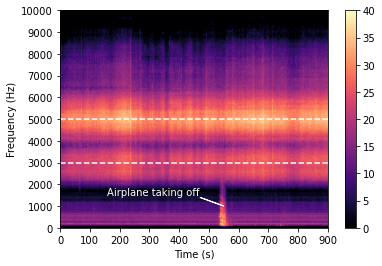

In [6]:
plt.specgram(
    sample_array,
    Fs=sampling_rate,
    NFFT=chunk_size,
    window=hamming(chunk_size),
    mode="psd",
    vmin=0,
    vmax=40,
    cmap="magma",
)
plt.hlines([5000, 3000], 0, delta, colors="white", linestyles=["--", "--"])
plt.colorbar()

plt.yticks(np.arange(0, 10001, 1000));
plt.xticks(np.arange(0, delta+1, 100));

plt.xlim(0, delta);
plt.ylim(0, 10000);

plt.xlabel("Time (s)");
plt.ylabel("Frequency (Hz)");

plt.arrow(550, 1000, -80, 400, color="white");
plt.text(470, 1400, "Airplane taking off", ha="right", va="bottom", color="white");

In [7]:
f, t, s = spectrogram(
    sample_array, sampling_rate, nfft=chunk_size, window=hamming(chunk_size), mode="psd"
)

# f = f / 1000  # to kHz

fmax_mean_index = np.argmax(s.mean(axis=1))
fmax_mean = f[fmax_mean_index]
fmax_std = f[np.argmax(s[fmax_mean_index - 10 : fmax_mean_index + 10], axis=0)].std() # allow some tolerance to find the local max but stay around

print(f"Main frequency is {fmax_mean:.1f} +- {fmax_std:.1f} Hz")

resolution = sampling_rate / chunk_size

print(f"Resolution with {chunk_size} points is {resolution:.1f} Hz")


Main frequency is 4921.9 +- 120.4 Hz
Resolution with 2048 points is 23.4 Hz


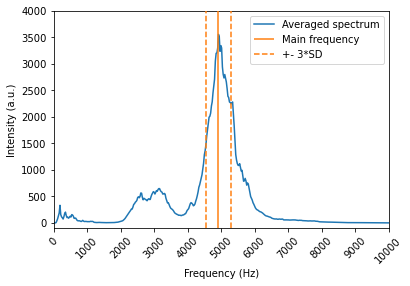

In [8]:
ymin = -100
ymax = 4000

fmax_lower = fmax_mean - 3*fmax_std
fmax_higher = fmax_mean + 3*fmax_std

plt.plot(f, s.mean(axis=1))
plt.vlines(fmax_mean, ymin, ymax, colors="C1", linestyles="-", zorder=10)
plt.vlines(
    [fmax_lower, fmax_higher],
    ymin,
    ymax,
    colors="C1",
    zorder=10,
    linestyles="--",
)
plt.xlim(0, 10_000);
plt.xticks(np.arange(0, 10_000+1, 1000), rotation=45);
plt.ylim(ymin, ymax);
plt.xlabel("Frequency (Hz)");
plt.ylabel("Intensity (a.u.)");
plt.legend(["Averaged spectrum", "Main frequency", "+- 3*SD"]);

In [9]:
# integrate signal around fmax_mean +/- 3*fmax_std
fmax_int = s[(f > fmax_lower) & (f < fmax_higher)].sum(axis=0)

# process the integrated signal with a hamming window
filter = hamming(256)
fmax_int_proc = np.convolve(filter/filter.sum(), fmax_int, mode="same")

# do the fourier transform of the processed integrated signal
# fmax_int_proc_fft = np.abs(fft(fmax_int_proc)[:len(fmax_int_proc)//2])
# fmax_freqs = fftfreq(len(t), delta/len(t))[:len(t)//2] # t in s -> freq in Hz

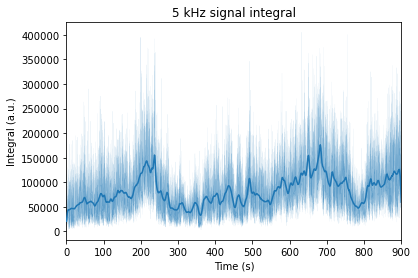

In [10]:
plt.plot(t, fmax_int, linewidth=0.05, alpha=0.7)
plt.plot(t, fmax_int_proc, linewidth=1.5, color="C0", zorder=5)
plt.xticks(np.arange(0, delta+1, 100));
plt.xlim(0, delta);
plt.xlabel("Time (s)")
plt.ylabel("Integral (a.u.)")
plt.title("5 kHz signal integral");


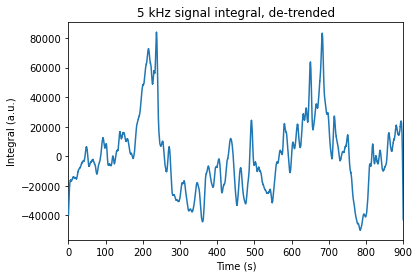

In [11]:
fmax_int_proc_detrend = detrend(fmax_int_proc, type="linear", )

plt.plot(t, fmax_int_proc_detrend, linewidth=1.5, color="C0", zorder=5)

plt.xticks(np.arange(0, delta+1, 100));
plt.xlim(0, delta);
plt.xlabel("Time (s)")
plt.ylabel("Integral (a.u.)")
plt.title("5 kHz signal integral, de-trended");


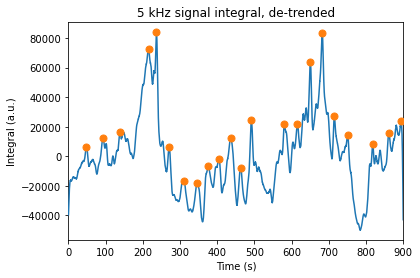

In [12]:
peak_indices, _ = find_peaks(fmax_int_proc_detrend, prominence=1e4)
peak_times = t[peak_indices]
peak_values = fmax_int_proc_detrend[peak_indices]

plt.plot(peak_times, peak_values, "o", color="C1", zorder=10, markersize=7)

plt.plot(t, fmax_int_proc_detrend, linewidth=1.5, color="C0", zorder=5)

plt.xticks(np.arange(0, delta+1, 100));
plt.xlim(0, delta);
plt.xlabel("Time (s)")
plt.ylabel("Integral (a.u.)")
plt.title("5 kHz signal integral, de-trended");

In [13]:
# calculate average distance between peaks
peak_distances = np.diff(peak_times)
print(
    f"Median peak distance is {np.median(peak_distances):.0f} s "
)

# sort peak times by peak intensity
peak_times_sorted = peak_times[np.argsort(peak_values)]
peak_distances_between_two_tallest = np.abs(np.diff(peak_times_sorted[-2:])[0])
print(
    f"Distance between two tallest peaks is {peak_distances_between_two_tallest:.0f} s"
)


Median peak distance is 35 s 
Distance between two tallest peaks is 446 s


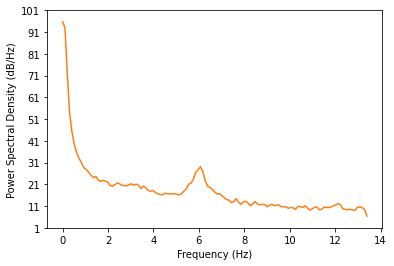

In [14]:
plt.psd(
    fmax_int_proc_detrend,
    NFFT=256,
    window=None,
    Fs=(t.size / delta),
    color="C1",
    detrend=None,
)
plt.grid(False);
plt.xlabel("Frequency (Hz)");


In [ ]:
# a pulsed signal 

